In [1]:
%load_ext autoreload
%autoreload 2
import matplotlib.pyplot as plt
from wbfm.utils.projects.finished_project_data import ProjectData
import napari
import pandas as pd
from tqdm.auto import tqdm
import numpy as np
from collections import defaultdict
import zarr
from pathlib import Path
import os
import seaborn as sns

/home/charles/anaconda3/envs/wbfm38/lib/python3.8/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


In [3]:
from sklearn.decomposition import PCA
from wbfm.utils.visualization.plot_traces import make_grid_plot_from_dataframe
import seaborn as sns
from wbfm.utils.visualization.filtering_traces import fill_nan_in_dataframe
import plotly.express as px
from wbfm.utils.general.utils_filenames import add_name_suffix

In [4]:
# Load multiple datasets
from wbfm.utils.general.hardcoded_paths import load_paper_datasets
all_projects_gcamp = load_paper_datasets(['gcamp', 'hannah_O2_fm'])

  0%|          | 0/23 [00:00<?, ?it/s]

Loaded 23 projects


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

Loaded 12 projects


In [5]:
all_projects_gfp = load_paper_datasets('gfp')

  0%|          | 0/8 [00:00<?, ?it/s]

Loaded 8 projects


In [6]:
all_projects_immob = load_paper_datasets('immob')

  0%|          | 0/3 [00:00<?, ?it/s]

ConfigFile  : WARNING  Could not find file None; Using hardcoded default raw data config: {'num_z_planes': 22, 'flyback_saved': False, 'num_flyback_planes_discarded': 2, 'z_step_size': 1.5, 'laser_561': 260, 'laser_488': 985, 'exposure_time': 12, 'agar': 2, 'recording_length_minutes': 8, 'ventral': 'left', 'strain': 'ZIM2165'}
ConfigFile  : WARNING  Could not find file None; Using hardcoded default raw data config: {'num_z_planes': 22, 'flyback_saved': False, 'num_flyback_planes_discarded': 2, 'z_step_size': 1.5, 'laser_561': 260, 'laser_488': 985, 'exposure_time': 12, 'agar': 2, 'recording_length_minutes': 8, 'ventral': 'left', 'strain': 'ZIM2165'}
ConfigFile  : WARNING  Could not find file None; Using hardcoded default raw data config: {'num_z_planes': 22, 'flyback_saved': False, 'num_flyback_planes_discarded': 2, 'z_step_size': 1.5, 'laser_561': 260, 'laser_488': 985, 'exposure_time': 12, 'agar': 2, 'recording_length_minutes': 8, 'ventral': 'left', 'strain': 'ZIM2165'}


  0%|          | 0/8 [00:00<?, ?it/s]

ConfigFile  : WARNING  Could not find file None; Using hardcoded default raw data config: {'num_z_planes': 22, 'flyback_saved': False, 'num_flyback_planes_discarded': 2, 'z_step_size': 1.5, 'laser_561': 260, 'laser_488': 985, 'exposure_time': 12, 'agar': 2, 'recording_length_minutes': 8, 'ventral': 'left', 'strain': 'ZIM2165'}
ConfigFile  : WARNING  Could not find file None; Using hardcoded default raw data config: {'num_z_planes': 22, 'flyback_saved': False, 'num_flyback_planes_discarded': 2, 'z_step_size': 1.5, 'laser_561': 260, 'laser_488': 985, 'exposure_time': 12, 'agar': 2, 'recording_length_minutes': 8, 'ventral': 'left', 'strain': 'ZIM2165'}
ConfigFile  : WARNING  Could not find file None; Using hardcoded default raw data config: {'num_z_planes': 22, 'flyback_saved': False, 'num_flyback_planes_discarded': 2, 'z_step_size': 1.5, 'laser_561': 260, 'laser_488': 985, 'exposure_time': 12, 'agar': 2, 'recording_length_minutes': 8, 'ventral': 'left', 'strain': 'ZIM2165'}
ConfigFile  :

In [8]:
# Get specific example datasets
project_data_gcamp = all_projects_gcamp['ZIM2165_Gcamp7b_worm1-2022_11_28']
project_data_immob = all_projects_immob['2022-12-13_15-16_ZIM2165_immob_worm9-2022-12-13']

In [9]:
project_data_gcamp

Project data for directory:
/scratch/neurobiology/zimmer/fieseler/wbfm_projects/2022-11-27_spacer_7b_2per_agar/ZIM2165_Gcamp7b_worm1-2022_11_28 
With raw data in directory:
/lisc/scratch/neurobiology/zimmer/ulises/wbfm/20221127/data/ZIM2165_Gcamp7b_worm1/2022-11-27_15-14_ZIM2165_worm1_GC7b_Ch0-BH 
See self.worm_posture_class for information on behavioral parameters
Found the following data files:
============Raw Videos=================
red_data:                 True
green_data:               True
============Segmentation===============
raw_segmentation:         True
colored_segmentation:     True
============Tracking===================
tracklets:                True
final_tracks:             True
manual_tracking:          True
============Traces=====================
traces:                   True


In [10]:
path_to_saved_data = "../step1_analysis/figure_1"
path_to_shared_saved_data = "/home/charles/Current_work/repos/dlc_for_wbfm/wbfm/notebooks/paper/step1_analysis/shared"


# Precalculate the trace dataframes (cached to disk)

In [ ]:
# # Optional: clear just one cache
# for project_dict in tqdm([all_projects_immob]):
#     for name, project_data in tqdm(project_dict.items()):
#         project_data.data_cacher.clear_disk_cache(delete_invalid_indices=False, delete_traces=True)

In [ ]:
# # Optional: clear the trace cache
# for project_dict in tqdm([all_projects_gcamp, all_projects_gfp, 
#                           all_projects_immob]):
#     for name, project_data in tqdm(project_dict.items()):
#         project_data.data_cacher.clear_disk_cache(delete_invalid_indices=False, delete_traces=True)

In [45]:
for project_dict in tqdm([all_projects_gcamp, all_projects_gfp, all_projects_immob]):
    for name, project_data in tqdm(project_dict.items()):
        df_traces = project_data.calc_paper_traces()
        df_res = project_data.calc_paper_traces_residual()
        df_global = project_data.calc_paper_traces_global()
        if df_res is None or df_global is None or df_traces is None:
            raise ValueError

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

ConfigFile  : WARNING  PPCA failed with error: operands could not be broadcast together with shapes (1042,45778) (45796,) (1042,45778) , skipping manifold-based outlier removal


/home/charles/anaconda3/envs/wbfm38/lib/python3.8/site-packages/ppca/_ppca.py:82: RuntimeWarning:

divide by zero encountered in log



  0%|          | 0/8 [00:00<?, ?it/s]

ConfigFile  : WARNING  PPCA failed with error: operands could not be broadcast together with shapes (1042,45778) (45796,) (1042,45778) , skipping manifold-based outlier removal
ConfigFile  : WARNING  Residual mode only works if nan are interpolated, enforcing that setting


/home/charles/anaconda3/envs/wbfm38/lib/python3.8/site-packages/ppca/_ppca.py:82: RuntimeWarning:

divide by zero encountered in log



  0%|          | 0/8 [00:00<?, ?it/s]

ConfigFile  : WARNING  PPCA failed with error: operands could not be broadcast together with shapes (1042,45778) (45796,) (1042,45778) , skipping manifold-based outlier removal
ConfigFile  : WARNING  Residual mode only works if nan are interpolated, enforcing that setting


/home/charles/anaconda3/envs/wbfm38/lib/python3.8/site-packages/ppca/_ppca.py:82: RuntimeWarning:

divide by zero encountered in log

/home/charles/anaconda3/envs/wbfm38/lib/python3.8/site-packages/ppca/_ppca.py:82: RuntimeWarning:

divide by zero encountered in log



ConfigFile  : WARNING  Residual mode only works if nan are interpolated, enforcing that setting


/home/charles/anaconda3/envs/wbfm38/lib/python3.8/site-packages/ppca/_ppca.py:82: RuntimeWarning:

divide by zero encountered in log



ConfigFile  : WARNING  Residual mode only works if nan are interpolated, enforcing that setting


/home/charles/anaconda3/envs/wbfm38/lib/python3.8/site-packages/ppca/_ppca.py:82: RuntimeWarning:

divide by zero encountered in log

/home/charles/anaconda3/envs/wbfm38/lib/python3.8/site-packages/ppca/_ppca.py:82: RuntimeWarning:

divide by zero encountered in log



ConfigFile  : WARNING  Residual mode only works if nan are interpolated, enforcing that setting


/home/charles/anaconda3/envs/wbfm38/lib/python3.8/site-packages/ppca/_ppca.py:82: RuntimeWarning:

divide by zero encountered in log



ConfigFile  : WARNING  Residual mode only works if nan are interpolated, enforcing that setting


/home/charles/anaconda3/envs/wbfm38/lib/python3.8/site-packages/ppca/_ppca.py:82: RuntimeWarning:

divide by zero encountered in log

/home/charles/Current_work/repos/dlc_for_wbfm/wbfm/utils/traces/bleach_correction.py:77: RankWarning:

Polyfit may be poorly conditioned

/home/charles/Current_work/repos/dlc_for_wbfm/wbfm/utils/traces/bleach_correction.py:77: RankWarning:

Polyfit may be poorly conditioned



  0%|          | 0/8 [00:00<?, ?it/s]

ConfigFile  : WARNING  PPCA failed with error: operands could not be broadcast together with shapes (1001,32041) (32400,) (1001,32041) , skipping manifold-based outlier removal


/home/charles/anaconda3/envs/wbfm38/lib/python3.8/site-packages/ppca/_ppca.py:82: RuntimeWarning:

divide by zero encountered in log



  0%|          | 0/8 [00:00<?, ?it/s]

ConfigFile  : WARNING  PPCA failed with error: operands could not be broadcast together with shapes (1001,32041) (32400,) (1001,32041) , skipping manifold-based outlier removal
ConfigFile  : WARNING  Residual mode only works if nan are interpolated, enforcing that setting


/home/charles/anaconda3/envs/wbfm38/lib/python3.8/site-packages/ppca/_ppca.py:82: RuntimeWarning:

divide by zero encountered in log



  0%|          | 0/8 [00:00<?, ?it/s]

ConfigFile  : WARNING  PPCA failed with error: operands could not be broadcast together with shapes (1001,32041) (32400,) (1001,32041) , skipping manifold-based outlier removal
ConfigFile  : WARNING  Residual mode only works if nan are interpolated, enforcing that setting


/home/charles/anaconda3/envs/wbfm38/lib/python3.8/site-packages/ppca/_ppca.py:82: RuntimeWarning:

divide by zero encountered in log

/home/charles/anaconda3/envs/wbfm38/lib/python3.8/site-packages/ppca/_ppca.py:82: RuntimeWarning:

divide by zero encountered in log



ConfigFile  : WARNING  Residual mode only works if nan are interpolated, enforcing that setting


/home/charles/anaconda3/envs/wbfm38/lib/python3.8/site-packages/ppca/_ppca.py:82: RuntimeWarning:

divide by zero encountered in log



ConfigFile  : WARNING  Residual mode only works if nan are interpolated, enforcing that setting


/home/charles/anaconda3/envs/wbfm38/lib/python3.8/site-packages/ppca/_ppca.py:82: RuntimeWarning:

divide by zero encountered in log



ConfigFile  : WARNING  Duplicate values found in neuron_name_to_manual_id_mapping: ['URADR'] (dataset: 2022-12-12_17-39_ZIM2165_immob_worm5-2022-12-12)
ConfigFile  : WARNING  Removed duplicates, leaving only the first instance of each


/home/charles/anaconda3/envs/wbfm38/lib/python3.8/site-packages/ppca/_ppca.py:82: RuntimeWarning:

divide by zero encountered in log



ConfigFile  : WARNING  Duplicate values found in neuron_name_to_manual_id_mapping: ['RIML', 'URADR'] (dataset: 2022-12-12_17-39_ZIM2165_immob_worm5-2022-12-12)
ConfigFile  : WARNING  Removed duplicates, leaving only the first instance of each
ConfigFile  : WARNING  Duplicate values found in neuron_name_to_manual_id_mapping: ['URADR'] (dataset: 2022-12-12_17-39_ZIM2165_immob_worm5-2022-12-12)
ConfigFile  : WARNING  Removed duplicates, leaving only the first instance of each
ConfigFile  : WARNING  Residual mode only works if nan are interpolated, enforcing that setting


/home/charles/anaconda3/envs/wbfm38/lib/python3.8/site-packages/ppca/_ppca.py:82: RuntimeWarning:

divide by zero encountered in log



ConfigFile  : WARNING  Duplicate values found in neuron_name_to_manual_id_mapping: ['RIML', 'URADR'] (dataset: 2022-12-12_17-39_ZIM2165_immob_worm5-2022-12-12)
ConfigFile  : WARNING  Removed duplicates, leaving only the first instance of each
ConfigFile  : WARNING  Duplicate values found in neuron_name_to_manual_id_mapping: ['URADR'] (dataset: 2022-12-12_17-39_ZIM2165_immob_worm5-2022-12-12)
ConfigFile  : WARNING  Removed duplicates, leaving only the first instance of each
ConfigFile  : WARNING  Residual mode only works if nan are interpolated, enforcing that setting


/home/charles/anaconda3/envs/wbfm38/lib/python3.8/site-packages/ppca/_ppca.py:82: RuntimeWarning:

divide by zero encountered in log



ConfigFile  : WARNING  Duplicate values found in neuron_name_to_manual_id_mapping: ['RIML', 'URADR'] (dataset: 2022-12-12_17-39_ZIM2165_immob_worm5-2022-12-12)
ConfigFile  : WARNING  Removed duplicates, leaving only the first instance of each


  0%|          | 0/8 [00:00<?, ?it/s]

ConfigFile  : WARNING  PPCA failed with error: operands could not be broadcast together with shapes (1001,32396) (32400,) (1001,32396) , skipping manifold-based outlier removal


/home/charles/anaconda3/envs/wbfm38/lib/python3.8/site-packages/ppca/_ppca.py:82: RuntimeWarning:

divide by zero encountered in log



  0%|          | 0/8 [00:00<?, ?it/s]

ConfigFile  : WARNING  PPCA failed with error: operands could not be broadcast together with shapes (1001,32396) (32400,) (1001,32396) , skipping manifold-based outlier removal
ConfigFile  : WARNING  Residual mode only works if nan are interpolated, enforcing that setting


/home/charles/anaconda3/envs/wbfm38/lib/python3.8/site-packages/ppca/_ppca.py:82: RuntimeWarning:

divide by zero encountered in log



  0%|          | 0/8 [00:00<?, ?it/s]

ConfigFile  : WARNING  PPCA failed with error: operands could not be broadcast together with shapes (1001,32396) (32400,) (1001,32396) , skipping manifold-based outlier removal
ConfigFile  : WARNING  Residual mode only works if nan are interpolated, enforcing that setting


/home/charles/anaconda3/envs/wbfm38/lib/python3.8/site-packages/ppca/_ppca.py:82: RuntimeWarning:

divide by zero encountered in log



  0%|          | 0/8 [00:00<?, ?it/s]

ConfigFile  : WARNING  PPCA failed with error: operands could not be broadcast together with shapes (1001,32396) (32400,) (1001,32396) , skipping manifold-based outlier removal


/home/charles/anaconda3/envs/wbfm38/lib/python3.8/site-packages/ppca/_ppca.py:82: RuntimeWarning:

divide by zero encountered in log



  0%|          | 0/8 [00:00<?, ?it/s]

ConfigFile  : WARNING  PPCA failed with error: operands could not be broadcast together with shapes (1001,32396) (32400,) (1001,32396) , skipping manifold-based outlier removal
ConfigFile  : WARNING  Residual mode only works if nan are interpolated, enforcing that setting


/home/charles/anaconda3/envs/wbfm38/lib/python3.8/site-packages/ppca/_ppca.py:82: RuntimeWarning:

divide by zero encountered in log



  0%|          | 0/8 [00:00<?, ?it/s]

ConfigFile  : WARNING  PPCA failed with error: operands could not be broadcast together with shapes (1001,32396) (32400,) (1001,32396) , skipping manifold-based outlier removal
ConfigFile  : WARNING  Residual mode only works if nan are interpolated, enforcing that setting


/home/charles/anaconda3/envs/wbfm38/lib/python3.8/site-packages/ppca/_ppca.py:82: RuntimeWarning:

divide by zero encountered in log



ConfigFile  : WARNING  Duplicate values found in neuron_name_to_manual_id_mapping: ['IL2LR'] (dataset: 2022-12-13_15-16_ZIM2165_immob_worm9-2022-12-13)
ConfigFile  : WARNING  Removed duplicates, leaving only the first instance of each


/home/charles/anaconda3/envs/wbfm38/lib/python3.8/site-packages/ppca/_ppca.py:82: RuntimeWarning:

divide by zero encountered in log



ConfigFile  : WARNING  Duplicate values found in neuron_name_to_manual_id_mapping: ['IL2LR'] (dataset: 2022-12-13_15-16_ZIM2165_immob_worm9-2022-12-13)
ConfigFile  : WARNING  Removed duplicates, leaving only the first instance of each
ConfigFile  : WARNING  Duplicate values found in neuron_name_to_manual_id_mapping: ['IL2LR'] (dataset: 2022-12-13_15-16_ZIM2165_immob_worm9-2022-12-13)
ConfigFile  : WARNING  Removed duplicates, leaving only the first instance of each
ConfigFile  : WARNING  Residual mode only works if nan are interpolated, enforcing that setting


/home/charles/anaconda3/envs/wbfm38/lib/python3.8/site-packages/ppca/_ppca.py:82: RuntimeWarning:

divide by zero encountered in log



ConfigFile  : WARNING  Duplicate values found in neuron_name_to_manual_id_mapping: ['IL2LR'] (dataset: 2022-12-13_15-16_ZIM2165_immob_worm9-2022-12-13)
ConfigFile  : WARNING  Removed duplicates, leaving only the first instance of each
ConfigFile  : WARNING  Duplicate values found in neuron_name_to_manual_id_mapping: ['IL2LR'] (dataset: 2022-12-13_15-16_ZIM2165_immob_worm9-2022-12-13)
ConfigFile  : WARNING  Removed duplicates, leaving only the first instance of each
ConfigFile  : WARNING  Residual mode only works if nan are interpolated, enforcing that setting


/home/charles/anaconda3/envs/wbfm38/lib/python3.8/site-packages/ppca/_ppca.py:82: RuntimeWarning:

divide by zero encountered in log



ConfigFile  : WARNING  Duplicate values found in neuron_name_to_manual_id_mapping: ['IL2LR'] (dataset: 2022-12-13_15-16_ZIM2165_immob_worm9-2022-12-13)
ConfigFile  : WARNING  Removed duplicates, leaving only the first instance of each


/home/charles/anaconda3/envs/wbfm38/lib/python3.8/site-packages/ppca/_ppca.py:82: RuntimeWarning:

divide by zero encountered in log



ConfigFile  : WARNING  Residual mode only works if nan are interpolated, enforcing that setting


/home/charles/anaconda3/envs/wbfm38/lib/python3.8/site-packages/ppca/_ppca.py:82: RuntimeWarning:

divide by zero encountered in log



ConfigFile  : WARNING  Residual mode only works if nan are interpolated, enforcing that setting


/home/charles/anaconda3/envs/wbfm38/lib/python3.8/site-packages/ppca/_ppca.py:82: RuntimeWarning:

divide by zero encountered in log



# Plots

## Heatmaps: immobilized and WBFM

In [11]:
from wbfm.utils.visualization.plot_traces import make_summary_interactive_heatmap_with_pca, make_summary_heatmap_and_subplots

In [12]:
project_data_gcamp.use_physical_x_axis = True
project_data_immob.use_physical_x_axis = True


In [ ]:
fig = make_summary_interactive_heatmap_with_pca(project_data_gcamp, to_save=True, to_show=True, output_folder="intro/example_summary_plots_wbfm")


In [10]:
# fig = make_summary_interactive_heatmap_with_pca(project_data_immob, to_save=True, to_show=True, output_folder="example_summary_plots_immob")

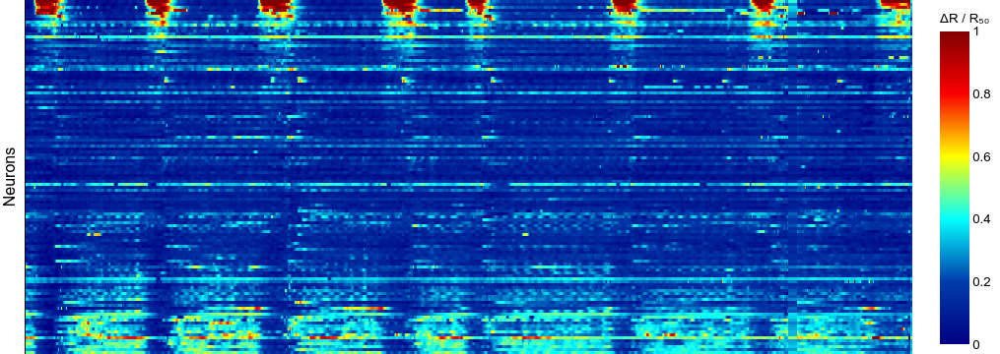

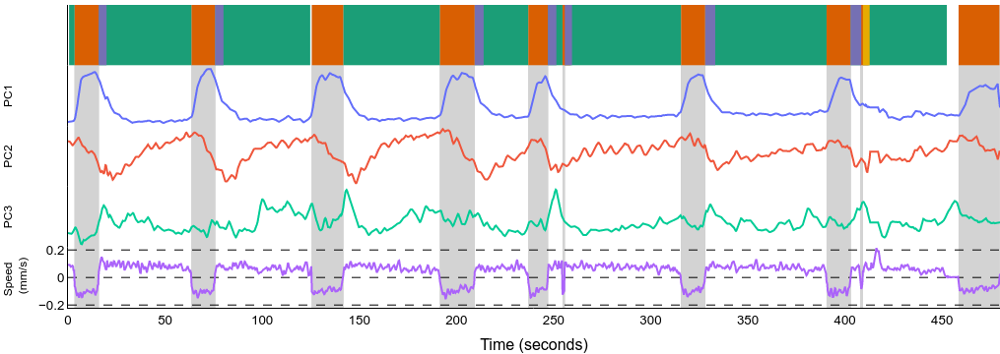

In [67]:
fig1, fig2 = make_summary_heatmap_and_subplots(project_data_gcamp, trace_opt=dict(use_paper_options=True), to_save=True, to_show=True, 
                                               output_folder="intro/example_summary_plots_wbfm")

ConfigFile  : WARNING  behavior_fname search failed; All calculations with curvature (kymograph) will fail


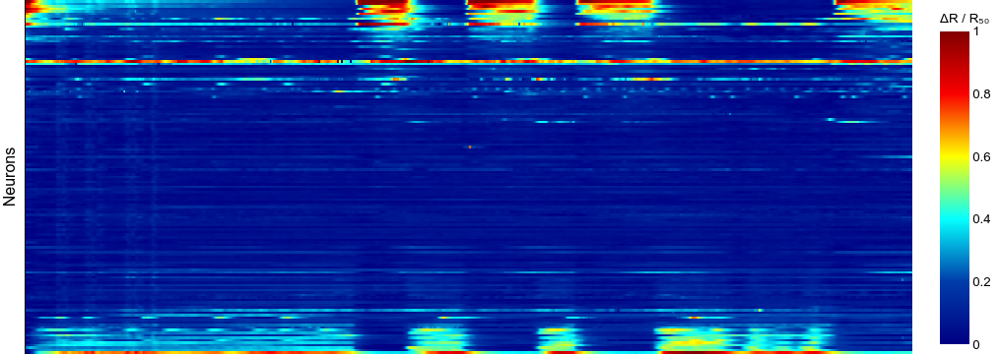

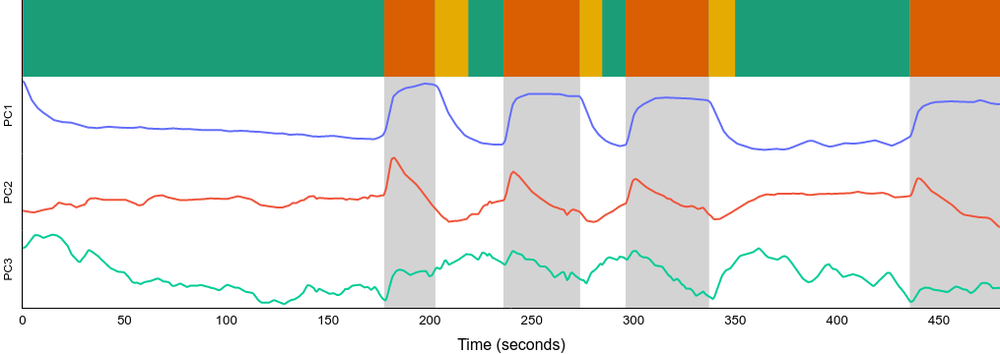

In [14]:
fig1, fig2 = make_summary_heatmap_and_subplots(project_data_immob, trace_opt=dict(use_paper_options=True), include_speed_subplot=False,
                                               to_save=True, to_show=True, output_folder="intro/example_summary_plots_immob")

## Triggered average examples

In [16]:
# from wbfm.utils.visualization.plot_traces import make_grid_plot_using_project
from wbfm.utils.traces.triggered_averages import FullDatasetTriggeredAverages
from wbfm.utils.general.utils_behavior_annotation import BehaviorCodes, shade_using_behavior, shade_triggered_average
from wbfm.utils.visualization.utils_plot_traces import plot_triggered_averages

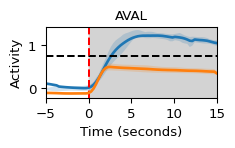

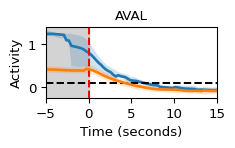

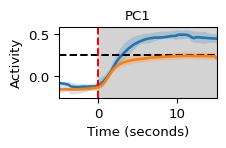

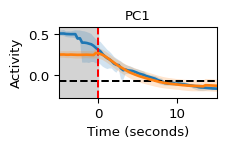

In [17]:
plot_triggered_averages([project_data_gcamp, project_data_immob], output_foldername="intro/basic_triggered_average")

## PCA variance explained plot of all datasets

In [34]:
from wbfm.utils.visualization.multiproject_wrappers import get_all_variance_explained
from wbfm.utils.visualization.utils_plot_traces import plot_with_shading
from wbfm.utils.general.utils_paper import apply_figure_settings, plotly_paper_color_discrete_map

In [16]:
gcamp_var, gfp_var, immob_var, gcamp_var_sum, gfp_var_sum, immob_var_sum = get_all_variance_explained(all_projects_gcamp, all_projects_gfp, all_projects_immob)

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

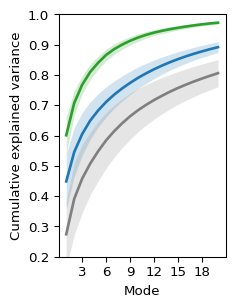

In [66]:
fig, ax = plt.subplots(dpi=200, figsize=(5,5))

var_sum_dict = {'Freely Moving (GCaMP)': gcamp_var_sum, 'Immobilized (GCaMP)': immob_var_sum, 'Freely Moving (GFP)': gfp_var_sum}
cmap = plotly_paper_color_discrete_map()

for name, mat in var_sum_dict.items():
    means = np.mean(mat, axis=1)
    color = cmap[name]
    plot_with_shading(means, np.std(mat, axis=1), label=name, ax=ax, lw=2,
                      x=np.arange(1, len(means) + 1), color=color)
# plt.legend()
# plt.title("Dimensionality")
plt.ylabel("Cumulative explained variance")
plt.ylim(0.2, 1.0)
plt.xlabel("Mode")

from matplotlib.ticker import MaxNLocator
ax.xaxis.set_major_locator(MaxNLocator(integer=True))

apply_figure_settings(fig, width_factor=0.3, height_factor=0.3, plotly_not_matplotlib=False)
plt.tight_layout()

output_foldername = 'intro'
fname = f"pca_cumulative_variance.png"
fname = os.path.join(output_foldername, fname)
plt.savefig(fname, transparent=True)
fig.savefig(fname.replace(".png", ".svg"), transparent=True)

# PCA weights across wbfm and immob

In [18]:
from wbfm.utils.visualization.utils_cca import calc_pca_weights_for_all_projects
from wbfm.utils.external.utils_plotly import plotly_boxplot_colored_boxes
from wbfm.utils.general.utils_paper import apply_figure_settings
from wbfm.utils.general.hardcoded_paths import neurons_with_confident_ids

2024-06-11 16:01:07.776131: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-11 16:01:07.942229: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/charles/anaconda3/envs/wbfm38/lib/python3.8/site-packages/cv2/../../lib64:/usr/local/cuda/lib64:/usr/local/cuda-11.4/lib64:
2024-06-11 16:01:07.942255: I tensorflow/compiler/xla/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2024-06-11 16:01:09.015057: W tensorflow/compiler/xla/stream_executor/platform/default/d

In [19]:
neuron_names = neurons_with_confident_ids()


In [20]:

wbfm_weights = calc_pca_weights_for_all_projects(all_projects_gcamp, use_paper_options=True, combine_left_right=True,
                                                neuron_names=neuron_names)

In [21]:
immob_weights = calc_pca_weights_for_all_projects(all_projects_immob, use_paper_options=True, combine_left_right=True,
                                                 neuron_names=neuron_names)

ConfigFile  : WARNING  behavior_fname search failed; All calculations with curvature (kymograph) will fail


ConfigFile  : WARNING  behavior_fname search failed; All calculations with curvature (kymograph) will fail


ConfigFile  : WARNING  behavior_fname search failed; All calculations with curvature (kymograph) will fail


ConfigFile  : WARNING  behavior_fname search failed; All calculations with curvature (kymograph) will fail


ConfigFile  : WARNING  behavior_fname search failed; All calculations with curvature (kymograph) will fail


ConfigFile  : WARNING  behavior_fname search failed; All calculations with curvature (kymograph) will fail


ConfigFile  : WARNING  behavior_fname search failed; All calculations with curvature (kymograph) will fail


ConfigFile  : WARNING  behavior_fname search failed; All calculations with curvature (kymograph) will fail


ConfigFile  : WARNING  behavior_fname search failed; All calculations with curvature (kymograph) will fail


In [22]:
# # Create a list of colors to highlight BAG
# base_color = '#1F77B4'  # Gray
# names = list(wbfm_weights.columns)
# colors = ['#000000' if 'BAG' in n else base_color for n in names]

# # fig = px.box(wbfm_weights)
# fig = plotly_boxplot_colored_boxes(wbfm_weights, colors)
# # Transparent background
# apply_figure_settings(fig, width_factor=0.6, height_factor=0.2, plotly_not_matplotlib=True)
# fig.update_yaxes(dict(title="PC1 weight"), zeroline=True, zerolinewidth=1, zerolinecolor="black")
# fig.update_xaxes(dict(title=""))
# # Add the 0 line back

# fig.show()

# fname = os.path.join("intro", 'wbfm_pca_weights.png')
# fig.write_image(fname, scale=3)
# fname = Path(fname).with_suffix('.svg')
# fig.write_image(fname)


In [23]:
# # Create a list of colors to highlight BAG
# base_color = '#FF7F0E'  # Orange, overall immob color
# names = list(immob_weights.columns)
# # colors = ['#EF553B' if 'BAG' in n else base_color for n in names]
# colors = ['#000000' if 'BAG' in n else base_color for n in names]

# fig = plotly_boxplot_colored_boxes(immob_weights, colors)
# apply_figure_settings(fig, width_factor=0.6, height_factor=0.2, plotly_not_matplotlib=True)
# fig.update_yaxes(dict(title="PC1 weight"), zeroline=True, zerolinewidth=1, zerolinecolor="black")
# fig.update_yaxes(dict(title="PC1 weight"))
# fig.update_xaxes(dict(title="Neuron Name"))
# fig.show()

# fname = os.path.join("intro", 'immob_pca_weights.png')
# fig.write_image(fname, scale=3)
# fname = Path(fname).with_suffix('.svg')
# fig.write_image(fname)


## FM and immob on same plot

In [49]:
from wbfm.utils.visualization.utils_plot_traces import add_p_value_annotation
from wbfm.utils.general.utils_paper import data_type_name_mapping, plotly_paper_color_discrete_map
import plotly.graph_objects as go

In [36]:
names_to_keep = set(wbfm_weights.columns).intersection(immob_weights.columns)
wbfm_melt = wbfm_weights.melt(var_name='neuron_name', value_name='PC1 weight').assign(dataset_type='gcamp')
immob_melt = immob_weights.melt(var_name='neuron_name', value_name='PC1 weight').assign(dataset_type='immob')
df_both = pd.concat([wbfm_melt, immob_melt], axis=0)
df_both = df_both[df_both['neuron_name'].isin(names_to_keep)]
df_both['Dataset Type'] = df_both['dataset_type'].map(data_type_name_mapping())
df_both['neuron_name'].unique()

array(['AVA', 'AVE', 'RIM', 'BAG', 'VA01', 'URYV', 'URYD', 'RMDV', 'SMDV',
       'RIV', 'ALA', 'RIS', 'URAD', 'VB02', 'VB03', 'URX', 'SMDD', 'RME',
       'RMEV', 'RID', 'RMED', 'AQR', 'AVB', 'RIB'], dtype=object)

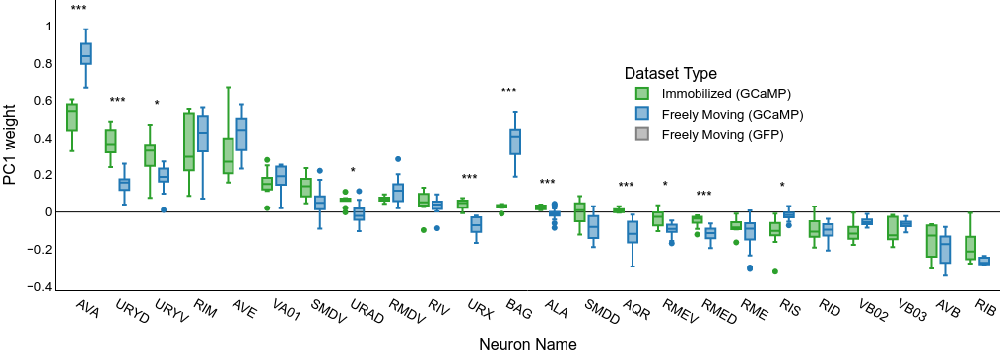

In [64]:

fig = px.box(df_both, y='PC1 weight', x='neuron_name', color='Dataset Type', 
            color_discrete_map=plotly_paper_color_discrete_map(),
            category_orders={'Dataset Type': ['Immobilized (GCaMP)', 'Freely Moving (GCaMP)']})

add_p_value_annotation(fig, x_label='all', show_ns=False, show_only_stars=True, permutations=1000,
                      height_mode='top_of_data')#, _format=dict(text_height=0.075))
apply_figure_settings(fig, width_factor=0.7, height_factor=0.3, plotly_not_matplotlib=True)

fig.update_layout(legend=dict(
    yanchor="top",
    y=0.8,
    xanchor="left",
    x=0.6
))
# Add a fake trace to get a legend entry for GFP
dummy_data = go.Box(
    x=[None],
    y=[None],
    # mode="markers",
    name="Freely Moving (GFP)",
    #fillcolor='gray', 
    line=dict(color='gray')
    # marker=dict(size=7, color="gray"),
)
fig.add_trace(dummy_data)

fig.update_yaxes(dict(title="PC1 weight"), zeroline=True, zerolinewidth=1, zerolinecolor="black")
fig.update_xaxes(dict(title="Neuron Name"))
fig.show()

fname = os.path.join("intro", 'fm_and_immob_pca_weights.png')
fig.write_image(fname, scale=3)
fname = Path(fname).with_suffix('.svg')
fig.write_image(fname)

In [31]:
%debug

> /home/charles/Current_work/repos/dlc_for_wbfm/wbfm/utils/visualization/utils_plot_traces.py(549)add_p_value_annotation()
    547         # print('0:', fig_dict['data'][data_pair[0]]['name'], fig_dict['data'][data_pair[0]]['xaxis'])
    548         # print('1:', fig_dict['data'][data_pair[1]]['name'], fig_dict['data'][data_pair[1]]['xaxis'])
--> 549         y0 = fig_dict['data'][data_pair[0]]['y']
    550         y1 = fig_dict['data'][data_pair[1]]['y']
    551 



ipdb>  array_columns == [None]


True


ipdb>  q


## Not used: gfp

In [16]:
gfp_weights = calc_pca_weights_for_all_projects(all_projects_gfp)

/home/charles/Current_work/repos/dlc_for_wbfm/wbfm/utils/traces/bleach_correction.py:78: RankWarning:

Polyfit may be poorly conditioned

/home/charles/Current_work/repos/dlc_for_wbfm/wbfm/utils/traces/bleach_correction.py:78: RankWarning:

Polyfit may be poorly conditioned

/home/charles/Current_work/repos/dlc_for_wbfm/wbfm/utils/traces/bleach_correction.py:78: RankWarning:

Polyfit may be poorly conditioned

/home/charles/Current_work/repos/dlc_for_wbfm/wbfm/utils/traces/bleach_correction.py:78: RankWarning:

Polyfit may be poorly conditioned



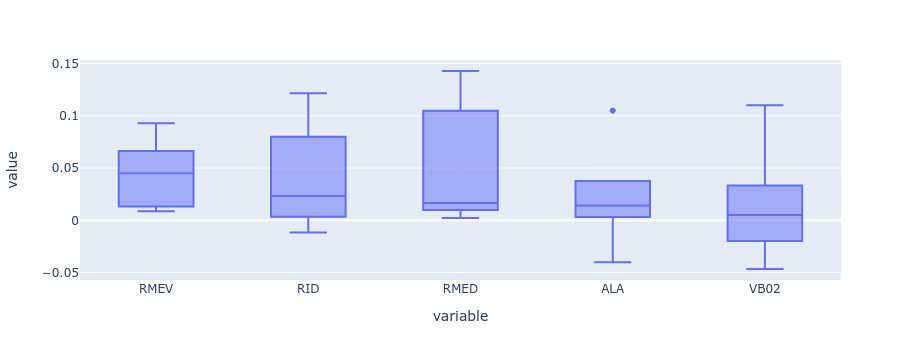

In [19]:
fig = px.box(gfp_weights)
fig.show()

fname = os.path.join(output_folder, 'gfp_pca_weights.png')
fig.write_image(fname)
fname = Path(fname).with_suffix('.svg')
fig.write_image(fname)


# Scratch

# Other

## Plateau in PC1 and speed during reversals

In [ ]:


from wbfm.utils.external.utils_pandas import calc_eventwise_cooccurrence_matrix

In [ ]:
# p = project_data_gcamp

df_all_occurances = []
for name, p in tqdm(all_projects_gcamp.items()):
    speed_plateau_state, _ = p.worm_posture_class.calc_piecewise_linear_plateau_state(replace_nan=True)
    pc1_plateau_state, _ = p.calc_plateau_state_using_pc1(replace_nan=True)

    rev_state = p.worm_posture_class.calc_behavior_from_alias('rev').astype(int)
    df = pd.DataFrame({'speed': speed_plateau_state, 'pc1': pc1_plateaus, 'rev': rev_state})
    df = df.fillna(False)

    df_occur = calc_eventwise_cooccurrence_matrix(df, 'speed', 'pc1', 'rev')
    df_occur['dataset'] = name
    df_all_occurances.append(df_occur)
df_all_cooccurances = pd.concat(df_all_occurances)

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

disp = ConfusionMatrixDisplay.from_predictions(df_all_cooccurances['speed'], df_all_cooccurances['pc1'],
                                              display_labels=['no plateau', 'plateau'], normalize='all')
plt.xlabel('Speed')
plt.ylabel('PC1')
plt.show()